In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/README.dataset.txt
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/README.roboflow.txt
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid/Cassava___mosaic_disease/624911036_jpg.rf.ac9da4d61a3cd99138a802daefd1229f.jpg
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid/Cassava___mosaic_disease/735041254_jpg.rf.cfa984d2b03def2bd55e9fe12b5363b6.jpg
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid/Cassava___mosaic_disease/535503922_jpg.rf.536e0d87f5644379a3279410d3e9a71f.jpg
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid/Cassava___mosaic_disease/4250754910_jpg.rf.c64189f92873ae3d824276f1c32c5a8f.jpg
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid/Cassava___mosaic_disease/3276292509_jpg.rf.889915ea0753493dc7944ddcd1d47765.jpg
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid/Cassava___mosaic_disease/131507385_jpg.rf.83d57d4fa4f398b8914ad5cdab101fc1.jpg
/

In [2]:
import os

print(os.listdir("/kaggle/input"))

['datasets']


In [3]:
import os
import pandas as pd

# Correct dataset path
DATASET_DIR = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset"

splits = ["train", "valid", "test"]

all_data = []

for split in splits:

    split_path = os.path.join(DATASET_DIR, split)

    print(f"Processing {split}...")

    for class_name in os.listdir(split_path):

        class_path = os.path.join(split_path, class_name)

        if os.path.isdir(class_path):

            for image_name in os.listdir(class_path):

                image_path = os.path.join(class_path, image_name)

                all_data.append({
                    "filepath": image_path,
                    "label": class_name,
                    "split": split
                })

# Create dataframe
df = pd.DataFrame(all_data)

print("\nTotal Images:", len(df))

# Save CSV
csv_path = "/kaggle/working/cassava_dataset.csv"

df.to_csv(csv_path, index=False)

print("\nCSV Created Successfully!")
print("Saved at:", csv_path)

# Show sample rows
df.head()

Processing train...
Processing valid...
Processing test...

Total Images: 15924

CSV Created Successfully!
Saved at: /kaggle/working/cassava_dataset.csv


,filepath,label,split
0,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train
1,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train
2,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train
3,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train
4,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train


In [4]:
from sklearn.preprocessing import LabelEncoder

# Create encoder
le = LabelEncoder()

# Convert labels to numbers
df['label_encoded'] = le.fit_transform(df['label'])

# Show mapping
label_mapping = dict(zip(le.classes_, range(len(le.classes_))))

print("Label Mapping:")
print(label_mapping)

# Save updated CSV
csv_path = "/kaggle/working/cassava_dataset_encoded.csv"

df.to_csv(csv_path, index=False)

print("\nEncoded CSV Saved!")
print(csv_path)

df.head()

Label Mapping:
{'Cassava___bacterial_blight': 0, 'Cassava___brown_streak_disease': 1, 'Cassava___green_mottle': 2, 'Cassava___healthy': 3, 'Cassava___mosaic_disease': 4}

Encoded CSV Saved!
/kaggle/working/cassava_dataset_encoded.csv


,filepath,label,split,label_encoded
0,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
1,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
2,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
3,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
4,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4


In [5]:
labels = list(le.classes_)

print(labels)

['Cassava___bacterial_blight', 'Cassava___brown_streak_disease', 'Cassava___green_mottle', 'Cassava___healthy', 'Cassava___mosaic_disease']


In [6]:
import pandas as pd

# Count images
class_counts = df['label'].value_counts().reset_index()

# Rename columns
class_counts.columns = ['Disease Class', 'Number of Images']

# Display
class_counts

,Disease Class,Number of Images
0,Cassava___green_mottle,3771
1,Cassava___mosaic_disease,3591
2,Cassava___healthy,3489
3,Cassava___brown_streak_disease,3446
4,Cassava___bacterial_blight,1627


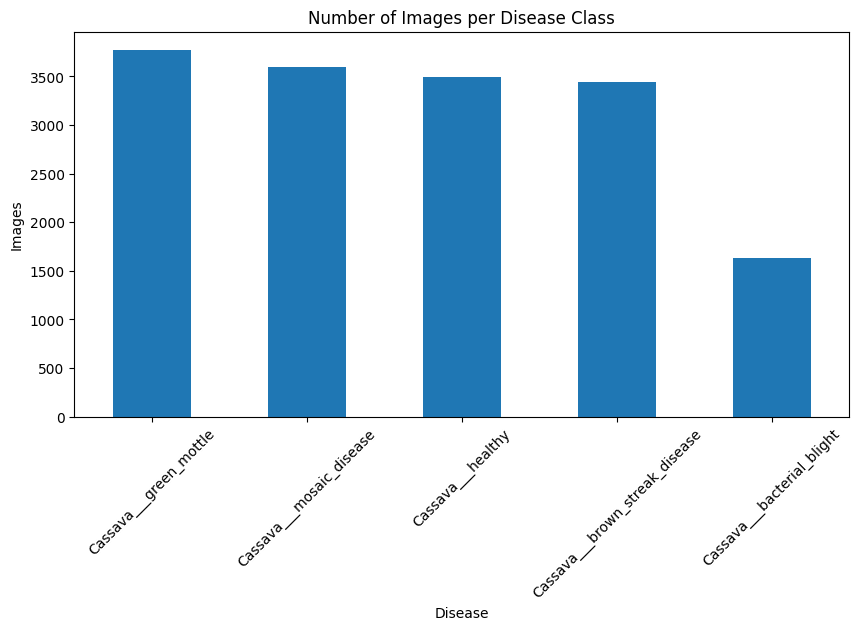

In [7]:
import matplotlib.pyplot as plt

# Count classes
counts = df['label'].value_counts()

# Plot
plt.figure(figsize=(10,5))
counts.plot(kind='bar')

plt.title("Number of Images per Disease Class")
plt.xlabel("Disease")
plt.ylabel("Images")

plt.xticks(rotation=45)

plt.show()

In [8]:
import pandas as pd

# Group by split and label
dataset_summary = df.groupby(['split', 'label']).size().reset_index(name='image_count')

# Show result
dataset_summary

,split,label,image_count
0,test,Cassava___bacterial_blight,196
1,test,Cassava___brown_streak_disease,418
2,test,Cassava___green_mottle,457
3,test,Cassava___healthy,423
4,test,Cassava___mosaic_disease,436
5,train,Cassava___bacterial_blight,1283
6,train,Cassava___brown_streak_disease,2715
7,train,Cassava___green_mottle,2971
8,train,Cassava___healthy,2748
9,train,Cassava___mosaic_disease,2829


In [9]:
for split in ['train', 'valid', 'test']:

    print(f"\n========== {split.upper()} DATASET ==========")

    split_df = df[df['split'] == split]

    counts = split_df['label'].value_counts()

    print(counts)


========== TRAIN DATASET ==========
label
Cassava___green_mottle            2971
Cassava___mosaic_disease          2829
Cassava___healthy                 2748
Cassava___brown_streak_disease    2715
Cassava___bacterial_blight        1283
Name: count, dtype: int64

========== VALID DATASET ==========
label
Cassava___green_mottle            343
Cassava___mosaic_disease          326
Cassava___healthy                 318
Cassava___brown_streak_disease    313
Cassava___bacterial_blight        148
Name: count, dtype: int64

========== TEST DATASET ==========
label
Cassava___green_mottle            457
Cassava___mosaic_disease          436
Cassava___healthy                 423
Cassava___brown_streak_disease    418
Cassava___bacterial_blight        196
Name: count, dtype: int64


In [10]:
label_map = {
    0: "Cassava___bacterial_blight",
    1: "Cassava___brown_streak_disease",
    2: "Cassava___green_mottle",
    3: "Cassava___healthy",
    4: "Cassava___mosaic_disease"
}

In [11]:
class_to_idx = {
    "Cassava___bacterial_blight": 0,
    "Cassava___brown_streak_disease": 1,
    "Cassava___green_mottle": 2,
    "Cassava___healthy": 3,
    "Cassava___mosaic_disease": 4
}

In [12]:
class_to_idx = {
    "Cassava___bacterial_blight": 0,
    "Cassava___brown_streak_disease": 1,
    "Cassava___green_mottle": 2,
    "Cassava___healthy": 3,
    "Cassava___mosaic_disease": 4
}

df['label_encoded'] = df['label'].map(class_to_idx)

df.head()

,filepath,label,split,label_encoded
0,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
1,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
2,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
3,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4
4,/kaggle/input/datasets/aliyafatma2/cassava-lea...,Cassava___mosaic_disease,train,4


In [13]:
df['label'].value_counts()

label
Cassava___green_mottle            3771
Cassava___mosaic_disease          3591
Cassava___healthy                 3489
Cassava___brown_streak_disease    3446
Cassava___bacterial_blight        1627
Name: count, dtype: int64

In [14]:
df.groupby(['split', 'label']).size()

split  label                         
test   Cassava___bacterial_blight         196
       Cassava___brown_streak_disease     418
       Cassava___green_mottle             457
       Cassava___healthy                  423
       Cassava___mosaic_disease           436
train  Cassava___bacterial_blight        1283
       Cassava___brown_streak_disease    2715
       Cassava___green_mottle            2971
       Cassava___healthy                 2748
       Cassava___mosaic_disease          2829
valid  Cassava___bacterial_blight         148
       Cassava___brown_streak_disease     313
       Cassava___green_mottle             343
       Cassava___healthy                  318
       Cassava___mosaic_disease           326
dtype: int64

In [15]:
labels = [
    "Cassava___bacterial_blight",
    "Cassava___brown_streak_disease",
    "Cassava___green_mottle",
    "Cassava___healthy",
    "Cassava___mosaic_disease"
]

with open("/kaggle/working/labels.txt", "w") as f:
    for label in labels:
        f.write(label + "\n")

In [16]:
total_images=len(df)
print("Total images:",total_images)

Total images: 15924


In [17]:
import pandas as pd

# Count images
class_counts = df['label'].value_counts().reset_index()

# Rename columns
class_counts.columns = ['Disease Class', 'Number of Images']

# Display
class_counts

,Disease Class,Number of Images
0,Cassava___green_mottle,3771
1,Cassava___mosaic_disease,3591
2,Cassava___healthy,3489
3,Cassava___brown_streak_disease,3446
4,Cassava___bacterial_blight,1627


In [18]:
class_to_idx = {
    "Cassava___bacterial_blight": 0,
    "Cassava___brown_streak_disease": 1,
    "Cassava___green_mottle": 2,
    "Cassava___healthy": 3,
    "Cassava___mosaic_disease": 4
}

In [19]:
idx_to_class = {
    0: "CBB",
    1: "CBSD",
    2: "CGM",
    3: "Healthy",
    4: "CMD"
}

In [20]:
train_df = df[df['split'] == 'train']
test_df = df[df['split'] == 'test']

In [21]:

train_df = train_df.rename(columns={
    'filepath': 'ID',
    'label_encoded': 'Labels'
})

test_df = test_df.rename(columns={
    'filepath': 'ID',
    'label_encoded': 'Labels'
})

In [22]:
train_df = train_df[['ID', 'Labels']]
test_df = test_df[['ID', 'Labels']]

In [23]:
print("Train data:")
print(train_df.head())

print("\nTest data:")
print(test_df.head())

Train data:
                                                  ID  Labels
0  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
1  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
2  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
3  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
4  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4

Test data:
                                                      ID  Labels
13994  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
13995  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
13996  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
13997  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4
13998  /kaggle/input/datasets/aliyafatma2/cassava-lea...       4


In [24]:
label_map = {
    '0': 'CBB',
    '1': 'CBSD',
    '2': 'CGM',
    '3': 'Healthy',
    '4': 'CMD'
}

print("\nLabel map:")
print(label_map)


Label map:
{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'Healthy', '4': 'CMD'}


In [25]:

train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
2    2971
4    2829
3    2748
1    2715
0    1283
Name: count, dtype: int64


In [26]:

print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 12546
Test: 1930

Class distribution (Train):
Labels
2    2971
4    2829
3    2748
1    2715
0    1283
Name: count, dtype: int64


In [27]:

print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)
     

[4 1 0 2 3]
int64


In [28]:
import os

print(os.listdir("/kaggle/input"))

['datasets']


In [29]:
import os

base_path = "/kaggle/input"

for folder in os.listdir(base_path):

    print(f"\n📂 {folder}")

    full_path = os.path.join(base_path, folder)

    if os.path.isdir(full_path):
        print(os.listdir(full_path)[:10])


📂 datasets
['aliyafatma2']


In [30]:
import os

base_path = "/kaggle/input"

total_images = 0

for root, dirs, files in os.walk(base_path):

    images = [
        f for f in files
        if f.lower().endswith(
            ('.jpg', '.jpeg', '.png')
        )
    ]

    total_images += len(images)

print("✅ Total Images Found:", total_images)

✅ Total Images Found: 15924


In [31]:
import os

print(os.listdir("/kaggle/input"))

['datasets']


In [32]:
import os

# Correct dataset paths
train_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/train"

test_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/test"

valid_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid"


# Function to count images
def count_images(folder):

    total = 0

    for root, dirs, files in os.walk(folder):

        images = [
            f for f in files
            if f.lower().endswith(
                ('.png', '.jpg', '.jpeg')
            )
        ]

        total += len(images)

    return total


# Print counts
print("✅ Total Train Images:",
      count_images(train_dir))

print("✅ Total Test Images:",
      count_images(test_dir))

print("✅ Total Validation Images:",
      count_images(valid_dir))

✅ Total Train Images: 12546
✅ Total Test Images: 1930
✅ Total Validation Images: 1448


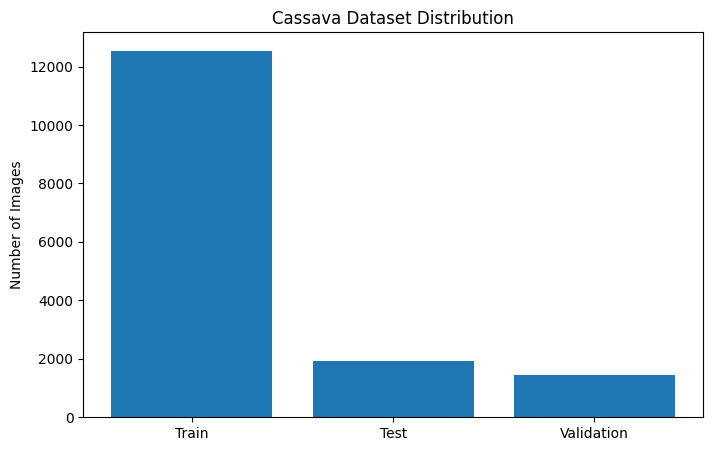

In [33]:
import matplotlib.pyplot as plt

datasets = ["Train", "Test", "Validation"]
counts = [12546, 1919, 1448]

plt.figure(figsize=(8,5))

plt.bar(datasets, counts)

plt.title("Cassava Dataset Distribution")
plt.ylabel("Number of Images")

plt.show()

In [34]:
import os
import pandas as pd

# Dataset root
dataset_root = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset"

# Label encoding
label_map = {
    "Cassava___bacterial_blight": 0,
    "Cassava___brown_streak_disease": 1,
    "Cassava___green_mottle": 2,
    "Cassava___healthy": 3,
    "Cassava___mosaic_disease": 4
}


# Function to create dataframe
def create_csv(split_name):

    split_path = os.path.join(dataset_root, split_name)

    data = []

    # Loop through disease folders
    for class_name in os.listdir(split_path):

        class_path = os.path.join(split_path, class_name)

        if os.path.isdir(class_path):

            label = label_map[class_name]

            # Loop through images
            for image_name in os.listdir(class_path):

                if image_name.lower().endswith(
                    ('.jpg', '.jpeg', '.png')
                ):

                    data.append({
                        "ID": image_name,
                        "Labels": label
                    })

    # Create dataframe
    df = pd.DataFrame(data)

    return df


# Create dataframes
train_df = create_csv("train")
test_df = create_csv("test")
valid_df = create_csv("valid")


# Save CSV files
train_df.to_csv("train.csv", index=False)
test_df.to_csv("test.csv", index=False)
valid_df.to_csv("valid.csv", index=False)


# Preview
print("✅ Train CSV")
print(train_df.head())

print("\n✅ Test CSV")
print(test_df.head())

print("\n✅ Validation CSV")
print(valid_df.head())

print("\nCSV files saved successfully.")

✅ Train CSV
                                                  ID  Labels
0  471647021_jpg.rf.5047fc5c7691493b5fe8632382435...       4
1  451433123_jpg.rf.de74570ca8e49a39080b4c9a8038d...       4
2  256135204_jpg.rf.7984beef03c8cce2c4fcbc5f50268...       4
3  612296656_jpg.rf.5d91b01f0c4e039d5388ab96a6693...       4
4  3254488090_jpg.rf.df92afd95ba19811b0f42cdff3d1...       4

✅ Test CSV
                                                  ID  Labels
0  629698342_jpg.rf.d9af0f606c6a2d527012cb51f6b8a...       4
1  328383026_jpg.rf.458e0b0f308ac52c332480772218c...       4
2  3210323320_jpg.rf.be97b58cacbbd08b5995c66999a5...       4
3  9255514_jpg.rf.7f7360f9f53996fa57a3619e3a9c0a3...       4
4  76786311_jpg.rf.bee44dbdbb9644ec8627c9b8020492...       4

✅ Validation CSV
                                                  ID  Labels
0  624911036_jpg.rf.ac9da4d61a3cd99138a802daefd12...       4
1  735041254_jpg.rf.cfa984d2b03def2bd55e9fe12b536...       4
2  535503922_jpg.rf.536e0d87f5644379a327941

In [35]:
print(train_df['Labels'].value_counts())

print(test_df['Labels'].value_counts())

print(valid_df['Labels'].value_counts())

Labels
2    2971
4    2829
3    2748
1    2715
0    1283
Name: count, dtype: int64
Labels
2    457
4    436
3    423
1    418
0    196
Name: count, dtype: int64
Labels
2    343
4    326
3    318
1    313
0    148
Name: count, dtype: int64


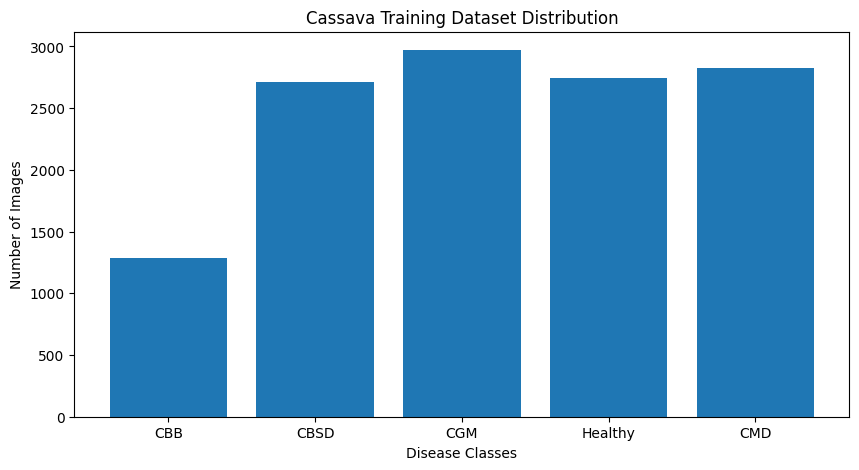

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Training distribution
train_counts = {
    0: 1283,
    1: 2715,
    2: 2971,
    3: 2748,
    4: 2829
}

# Label names
label_names = {
    0: "CBB",
    1: "CBSD",
    2: "CGM",
    3: "Healthy",
    4: "CMD"
}

# Convert to dataframe
train_df_plot = pd.DataFrame({
    "Disease": [label_names[k] for k in train_counts.keys()],
    "Images": list(train_counts.values())
})

# Plot
plt.figure(figsize=(10,5))

plt.bar(
    train_df_plot["Disease"],
    train_df_plot["Images"]
)

plt.title("Cassava Training Dataset Distribution")
plt.xlabel("Disease Classes")
plt.ylabel("Number of Images")

plt.show()

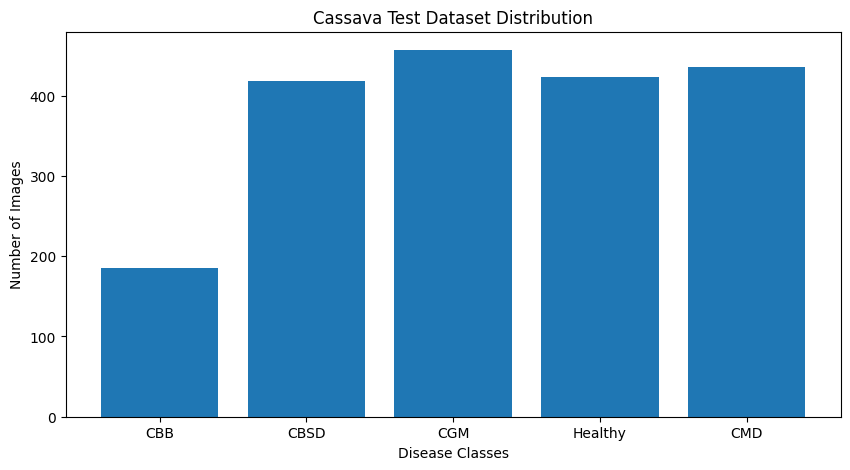

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Training distribution
test_counts = {
    0: 185,
    1: 418,
    2: 457,
    3: 423,
    4: 436
}

# Label names
label_names = {
    0: "CBB",
    1: "CBSD",
    2: "CGM",
    3: "Healthy",
    4: "CMD"
}

# Convert to dataframe
test_df_plot = pd.DataFrame({
    "Disease": [label_names[k] for k in test_counts.keys()],
    "Images": list(test_counts.values())
})

# Plot
plt.figure(figsize=(10,5))

plt.bar(
    test_df_plot["Disease"],
    test_df_plot["Images"]
)

plt.title("Cassava Test Dataset Distribution")
plt.xlabel("Disease Classes")
plt.ylabel("Number of Images")

plt.show()

In [38]:
import pandas as pd

train_df = pd.read_csv("/kaggle/working/train.csv")

print(train_df.head())
print(train_df.columns)

                                                  ID  Labels
0  471647021_jpg.rf.5047fc5c7691493b5fe8632382435...       4
1  451433123_jpg.rf.de74570ca8e49a39080b4c9a8038d...       4
2  256135204_jpg.rf.7984beef03c8cce2c4fcbc5f50268...       4
3  612296656_jpg.rf.5d91b01f0c4e039d5388ab96a6693...       4
4  3254488090_jpg.rf.df92afd95ba19811b0f42cdff3d1...       4
Index(['ID', 'Labels'], dtype='object')


In [39]:
import pandas as pd

df = pd.read_csv("/kaggle/working/train.csv")

print(df["Labels"].value_counts().sort_index())

Labels
0    1283
1    2715
2    2971
3    2748
4    2829
Name: count, dtype: int64


In [40]:
with open("/kaggle/working/labels.txt","r") as f:
    print(f.read())

Cassava___bacterial_blight
Cassava___brown_streak_disease
Cassava___green_mottle
Cassava___healthy
Cassava___mosaic_disease



In [41]:
import os
import cv2
import random
import pandas as pd
from tqdm import tqdm
import albumentations as A

# =========================
# CONFIG
# =========================

TRAIN_DIR = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/train"
TRAIN_CSV = "/kaggle/working/train.csv"

CLASS_NAME = "Cassava___bacterial_blight"
CLASS_LABEL = 0

TARGET_COUNT = 3000

# =========================
# LOAD CSV
# =========================

train_df = pd.read_csv(TRAIN_CSV)

# =========================
# SOURCE FOLDER
# =========================

source_dir = os.path.join(TRAIN_DIR, CLASS_NAME)

files = [
    f for f in os.listdir(source_dir)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

current_count = len(files)
needed = TARGET_COUNT - current_count

print(f"Current images: {current_count}")
print(f"Augmented images needed: {needed}")

# =========================
# OUTPUT FOLDER
# =========================

aug_dir = "/kaggle/working/augmented_bacterial_blight"
os.makedirs(aug_dir, exist_ok=True)

# =========================
# AUGMENTATIONS
# =========================

transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.Rotate(limit=30, p=0.7),
    A.RandomBrightnessContrast(
        brightness_limit=0.2,
        contrast_limit=0.2,
        p=0.5
    ),
    A.ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.1,
        rotate_limit=20,
        p=0.5
    )
])

# =========================
# GENERATE IMAGES + CSV ROWS
# =========================

new_rows = []

for i in tqdm(range(needed)):

    img_name = random.choice(files)

    img = cv2.imread(os.path.join(source_dir, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    aug_img = transform(image=img)["image"]

    new_name = f"aug_{i:05d}.jpg"

    cv2.imwrite(
        os.path.join(aug_dir, new_name),
        cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR)
    )

    new_rows.append({
        "ID": new_name,
        "Labels": CLASS_LABEL
    })

# =========================
# SAVE AUGMENTED CSV
# =========================

aug_df = pd.DataFrame(new_rows)

aug_df.to_csv(
    "/kaggle/working/augmented_bacterial_blight.csv",
    index=False
)

# =========================
# CREATE BALANCED CSV
# =========================

balanced_df = pd.concat(
    [train_df, aug_df],
    ignore_index=True
)

balanced_df.to_csv(
    "/kaggle/working/train_balanced.csv",
    index=False
)

print("Done!")
print("Saved:")
print("/kaggle/working/augmented_bacterial_blight.csv")
print("/kaggle/working/train_balanced.csv")

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Current images: 1283
Augmented images needed: 1717


100%|██████████| 1717/1717 [00:15<00:00, 107.62it/s]


Done!
Saved:
/kaggle/working/augmented_bacterial_blight.csv
/kaggle/working/train_balanced.csv


In [42]:
import pandas as pd

df = pd.read_csv("/kaggle/working/train_balanced.csv")

print(df["Labels"].value_counts().sort_index())

Labels
0    3000
1    2715
2    2971
3    2748
4    2829
Name: count, dtype: int64


In [43]:
import os
import shutil

train_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/train"

balanced_dir = "/kaggle/working/balanced_train"

shutil.copytree(train_dir, balanced_dir, dirs_exist_ok=True)

src_aug = "/kaggle/working/augmented_bacterial_blight"
dst_class = os.path.join(
    balanced_dir,
    "Cassava___bacterial_blight"
)

for img in os.listdir(src_aug):
    shutil.copy(
        os.path.join(src_aug, img),
        os.path.join(dst_class, img)
    )

print("Balanced folder ready.")

Balanced folder ready.


In [44]:
for cls in sorted(os.listdir(balanced_dir)):
    path = os.path.join(balanced_dir, cls)

    if os.path.isdir(path):
        print(cls, len(os.listdir(path)))

Cassava___bacterial_blight 3000
Cassava___brown_streak_disease 2715
Cassava___green_mottle 2971
Cassava___healthy 2748
Cassava___mosaic_disease 2829


In [45]:
import os
import cv2
import matplotlib.pyplot as plt

# Dataset root
dataset_root = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset"

# Label map
label_map = {
    0: "Cassava___bacterial_blight",
    1: "Cassava___brown_streak_disease",
    2: "Cassava___green_mottle",
    3: "Cassava___healthy",
    4: "Cassava___mosaic_disease"
}


# Function to display image
def show_image(df, index, split="train"):

    # Get image info
    image_name = df.iloc[index]["ID"]
    label = df.iloc[index]["Labels"]

    # Get class folder
    class_name = label_map[label]

    # Full image path
    image_path = os.path.join(
        dataset_root,
        split,
        class_name,
        image_name
    )

    # Read image
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display
    plt.figure(figsize=(6,6))

    plt.imshow(image)

    plt.title(f"Label: {label} | {class_name}")

    plt.axis("off")

    plt.show()

    # Print path
    print("Image Path:")
    print(image_path)

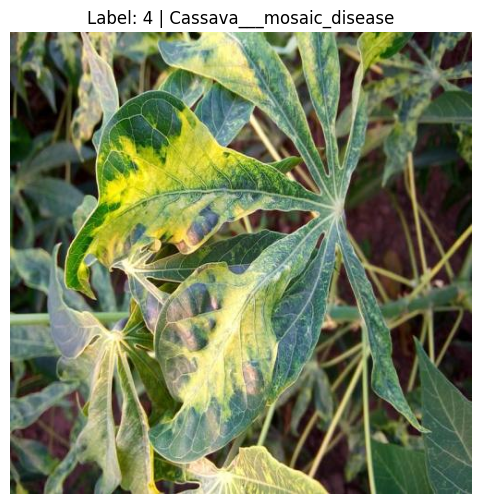

Image Path:
/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/train/Cassava___mosaic_disease/451433123_jpg.rf.de74570ca8e49a39080b4c9a8038d17d.jpg


In [46]:
show_image(train_df, 1, split="train")

In [47]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Dataset root
dataset_root = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/train"

# Label map
label_map = {
    0: "Cassava___bacterial_blight",
    1: "Cassava___brown_streak_disease",
    2: "Cassava___green_mottle",
    3: "Cassava___healthy",
    4: "Cassava___mosaic_disease"
}


# Function to show disease-wise images
def show_disease_images(label, num_images=5):

    class_name = label_map[label]

    class_path = os.path.join(
        dataset_root,
        class_name
    )

    # Get image list
    images = [
        img for img in os.listdir(class_path)
        if img.lower().endswith(
            ('.jpg', '.jpeg', '.png')
        )
    ]

    # Random sample
    selected_images = random.sample(
        images,
        min(num_images, len(images))
    )

    # Plot
    plt.figure(figsize=(15,5))

    for i, image_name in enumerate(selected_images):

        image_path = os.path.join(
            class_path,
            image_name
        )

        image = cv2.imread(image_path)

        image = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        plt.subplot(1, num_images, i+1)

        plt.imshow(image)

        plt.title(f"Label {label}")

        plt.axis("off")

    plt.suptitle(class_name, fontsize=16)

    plt.show()

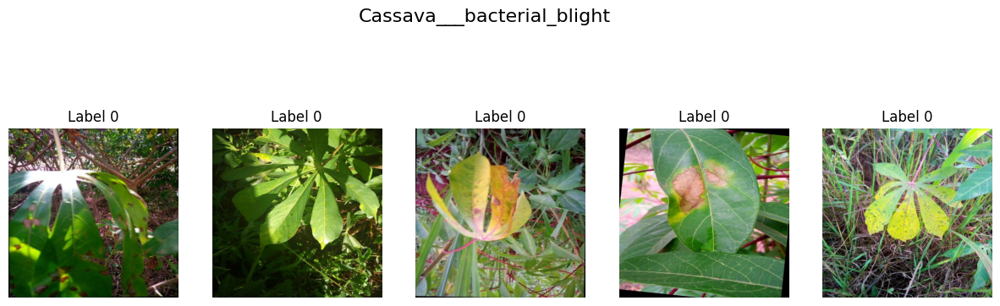

In [48]:
show_disease_images(0)

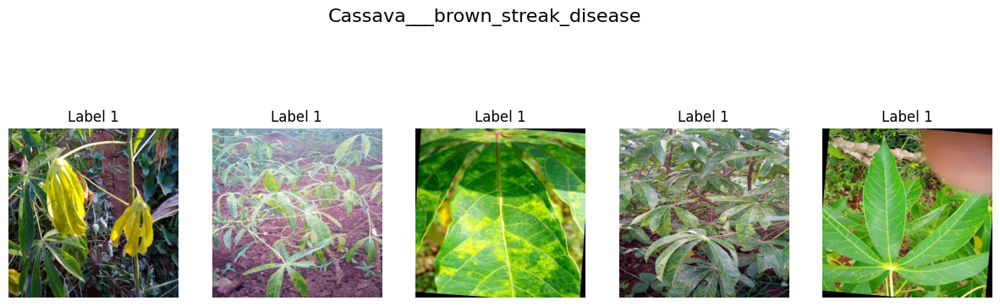

In [49]:
show_disease_images(1)

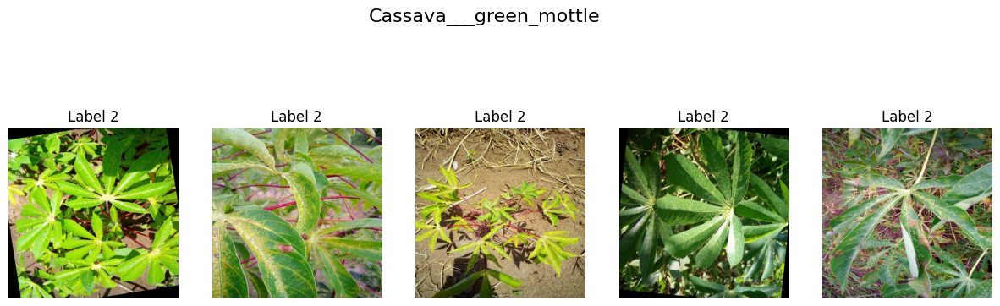

In [50]:
show_disease_images(2)

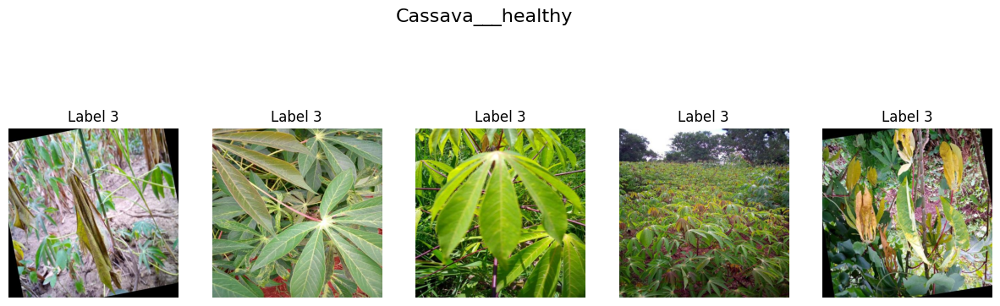

In [51]:
show_disease_images(3)

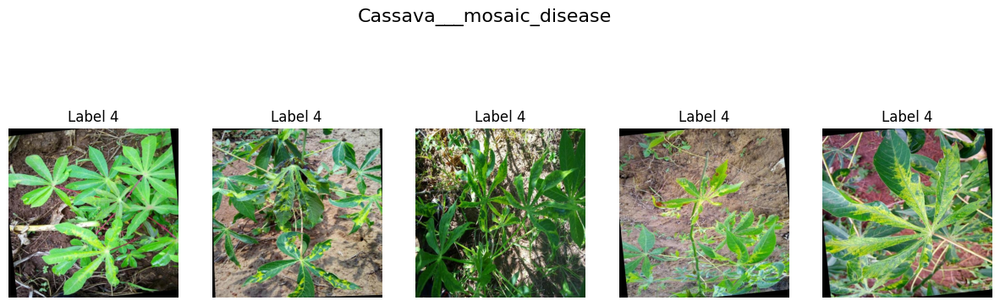

In [52]:
show_disease_images(4)


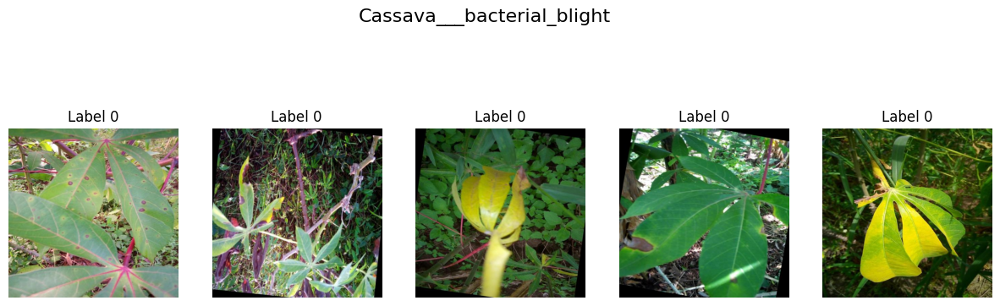

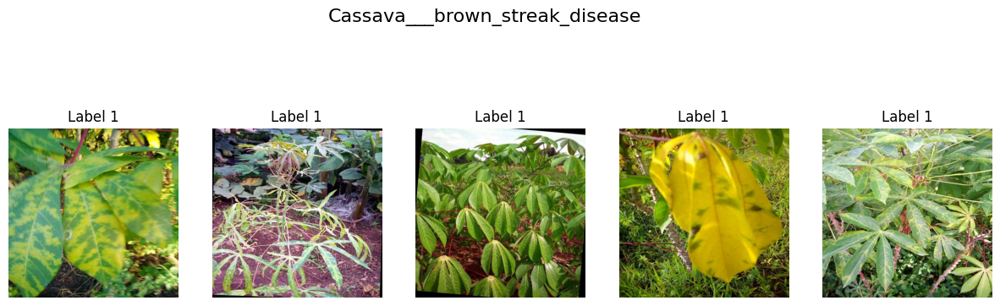

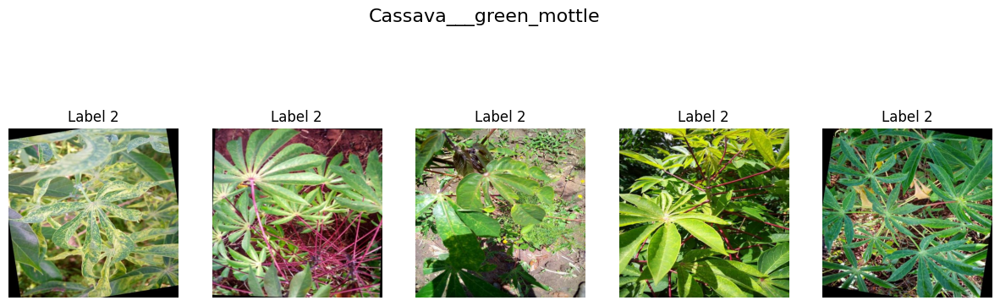

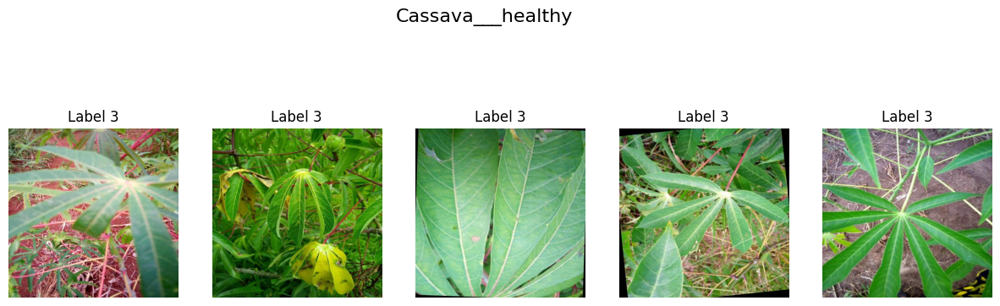

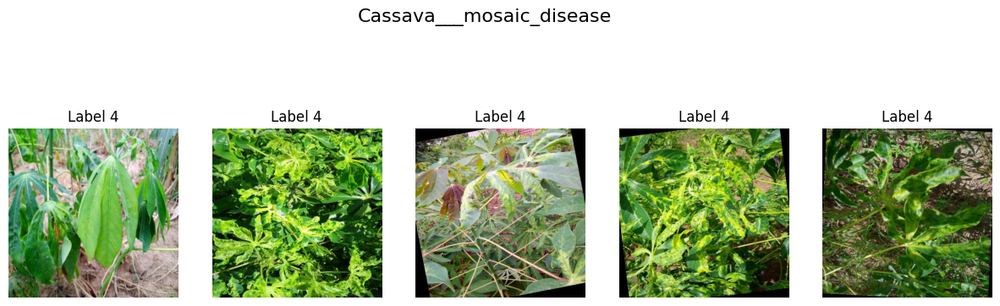

In [53]:
for label in range(5):

    show_disease_images(label)

In [54]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt

# Dataset root
dataset_root = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/train"

# Disease labels
label_map = {
    0: "Cassava___bacterial_blight",
    1: "Cassava___brown_streak_disease",
    2: "Cassava___green_mottle",
    3: "Cassava___healthy",
    4: "Cassava___mosaic_disease"
}


# Function to preprocess and display
def preprocess_disease_image(label):

    class_name = label_map[label]

    class_path = os.path.join(
        dataset_root,
        class_name
    )

    # Get random image
    image_name = random.choice(os.listdir(class_path))

    image_path = os.path.join(
        class_path,
        image_name
    )

    # Read image
    image = cv2.imread(image_path)

    # Convert RGB
    rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    # Resize
    resized = cv2.resize(rgb, (224, 224))

    # Grayscale
    gray = cv2.cvtColor(
        resized,
        cv2.COLOR_RGB2GRAY
    )

    # Gaussian Blur
    blur = cv2.GaussianBlur(
        gray,
        (5,5),
        0
    )

    # Edge Detection
    edges = cv2.Canny(
        blur,
        100,
        200
    )

    # Thresholding
    _, thresh = cv2.threshold(
        gray,
        127,
        255,
        cv2.THRESH_BINARY
    )

    # Histogram Equalization
    hist_eq = cv2.equalizeHist(gray)

    # Median Blur
    median = cv2.medianBlur(
        gray,
        5
    )

    # Plot
    images = [
        rgb,
        gray,
        blur,
        edges,
        thresh,
        hist_eq,
        median
    ]

    titles = [
        "Original",
        "Grayscale",
        "Gaussian Blur",
        "Edges",
        "Threshold",
        "Hist Equalization",
        "Median Blur"
    ]

    plt.figure(figsize=(18,10))

    for i in range(len(images)):

        plt.subplot(2,4,i+1)

        if len(images[i].shape) == 2:
            plt.imshow(images[i], cmap='gray')
        else:
            plt.imshow(images[i])

        plt.title(titles[i])

        plt.axis("off")

    plt.suptitle(
        f"{class_name}",
        fontsize=18
    )

    plt.show()

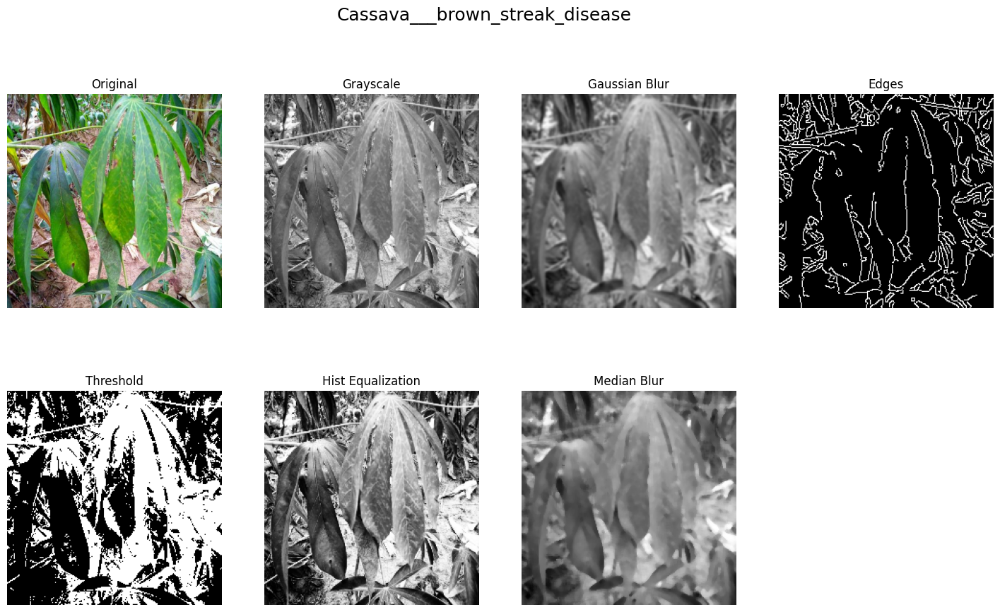

In [55]:
preprocess_disease_image(1)

In [56]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt

from tensorflow.keras.applications import EfficientNetV2B3
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import (
    Input,
    GlobalAveragePooling2D,
    Dense,
    Dropout,
    BatchNormalization
)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

2026-06-18 17:01:14.184857: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1781802074.370462      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1781802074.431802      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1781802074.918065      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1781802074.918095      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1781802074.918098      58 computation_placer.cc:177] computation placer alr

In [57]:
IMG_SIZE = 300
BATCH_SIZE = 32
NUM_CLASSES =5

HEAD_EPOCHS = 15
FINE_TUNE_EPOCHS = 20

In [58]:
train_dir = "/kaggle/working/balanced_train"

valid_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/valid"

test_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/test"

In [59]:
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    zoom_range=0.20,
    shear_range=0.10,
    horizontal_flip=True,
    fill_mode="nearest"
)

valid_datagen = ImageDataGenerator()

test_datagen = ImageDataGenerator()

In [60]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=True
)

valid_generator = valid_datagen.flow_from_directory(
    valid_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    shuffle=False
)

Found 14263 images belonging to 5 classes.
Found 1448 images belonging to 5 classes.
Found 1930 images belonging to 5 classes.


In [61]:
base_model = EfficientNetV2B3(

    weights="imagenet",

    include_top=False,

    input_shape=(IMG_SIZE, IMG_SIZE, 3)

)

base_model.trainable = False

inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = base_model(inputs, training=False)

x = GlobalAveragePooling2D()(x)

x = BatchNormalization()(x)

x = Dropout(0.40)(x)

x = Dense(
    512,
    activation="relu",
    kernel_regularizer=tf.keras.regularizers.l2(1e-4)
)(x)

x = BatchNormalization()(x)

x = Dropout(0.30)(x)

outputs = Dense(NUM_CLASSES, activation="softmax")(x)

model = Model(inputs, outputs)

model.summary()

I0000 00:00:1781802087.311175      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15511 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


52606240/52606240 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 300, 300, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b3 (Functional)  │ (None, 10, 10, 1536)   │    12,930,622 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       786,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,728,323 (52.37 MB)

 Trainable params: 793,605 (3.03 MB)

 Non-trainable params: 12,934,718 (49.34 MB)

In [62]:
model.compile(

    optimizer=tf.keras.optimizers.Adam(
        learning_rate=3e-4
    ),

    loss=tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    ),

    metrics=[
        "accuracy",
        tf.keras.metrics.TopKCategoricalAccuracy(
            k=2,
            name="top2_acc"
        )
    ]
)

In [63]:
callbacks = [

    ModelCheckpoint(
        "best_v2b3.keras",
        monitor="val_accuracy",
        save_best_only=True,
        mode="max"
    ),

    EarlyStopping(
        monitor="val_accuracy",
        patience=5,
        restore_best_weights=True
    ),

    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.2,
        patience=2,
        min_lr=1e-6
    )

]

In [64]:
history_head = model.fit(

    train_generator,

    validation_data=valid_generator,

    epochs=HEAD_EPOCHS,

    callbacks=callbacks,

    verbose=1

)

Epoch 1/15


I0000 00:00:1781802110.364358     152 service.cc:152] XLA service 0x790ddc002390 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1781802110.364399     152 service.cc:160]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1781802114.114254     152 cuda_dnn.cc:529] Loaded cuDNN version 91002
I0000 00:00:1781802136.087318     152 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


446/446 ━━━━━━━━━━━━━━━━━━━━ 384s 759ms/step - accuracy: 0.4754 - loss: 1.6374 - top2_acc: 0.7102 - val_accuracy: 0.6022 - val_loss: 1.1763 - val_top2_acc: 0.8156 - learning_rate: 3.0000e-04
Epoch 2/15
446/446 ━━━━━━━━━━━━━━━━━━━━ 283s 635ms/step - accuracy: 0.5328 - loss: 1.3959 - top2_acc: 0.7658 - val_accuracy: 0.6222 - val_loss: 1.1097 - val_top2_acc: 0.8419 - learning_rate: 3.0000e-04
Epoch 3/15
446/446 ━━━━━━━━━━━━━━━━━━━━ 285s 638ms/step - accuracy: 0.5584 - loss: 1.3036 - top2_acc: 0.7849 - val_accuracy: 0.6347 - val_loss: 1.0920 - val_top2_acc: 0.8481 - learning_rate: 3.0000e-04
Epoch 4/15
446/446 ━━━━━━━━━━━━━━━━━━━━ 285s 639ms/step - accuracy: 0.5771 - loss: 1.2383 - top2_acc: 0.7956 - val_accuracy: 0.5905 - val_loss: 1.1560 - val_top2_acc: 0.8363 - learning_rate: 3.0000e-04
Epoch 5/15
446/446 ━━━━━━━━━━━━━━━━━━━━ 289s 647ms/step - accuracy: 0.5887 - loss: 1.2010 - top2_acc: 0.8101 - val_accuracy: 0.6430 - val_loss: 1.0881 - val_top2_acc: 0.8439 - learning_rate: 3.0000e-04
E

46/46 ━━━━━━━━━━━━━━━━━━━━ 28s 376ms/step


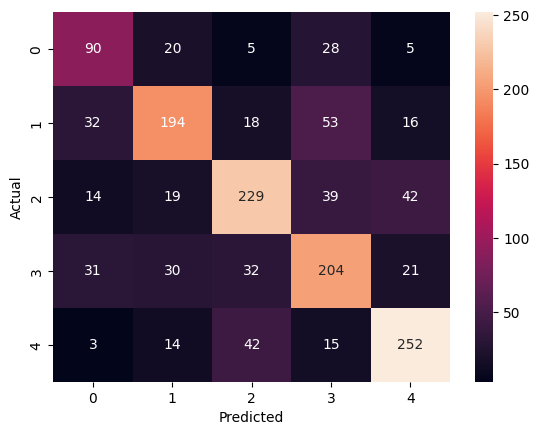

In [65]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

pred = model.predict(valid_generator)
y_pred = np.argmax(pred, axis=1)

cm = confusion_matrix(
    valid_generator.classes,
    y_pred
)

sns.heatmap(
    cm,
    annot=True,
    fmt='d'
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [66]:
from sklearn.metrics import classification_report
import numpy as np

# Predict on validation set
predictions = model.predict(valid_generator)

# Convert probabilities to class indices
y_pred = np.argmax(predictions, axis=1)

# True labels
y_true = valid_generator.classes

# Class names
class_names = list(valid_generator.class_indices.keys())

# Classification Report
report = classification_report(
    y_true,
    y_pred,
    target_names=class_names
)

print(report)

46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 128ms/step
                                precision    recall  f1-score   support

    Cassava___bacterial_blight       0.53      0.61      0.57       148
Cassava___brown_streak_disease       0.70      0.62      0.66       313
        Cassava___green_mottle       0.70      0.67      0.68       343
             Cassava___healthy       0.60      0.64      0.62       318
      Cassava___mosaic_disease       0.75      0.77      0.76       326

                      accuracy                           0.67      1448
                     macro avg       0.66      0.66      0.66      1448
                  weighted avg       0.67      0.67      0.67      1448



In [67]:
results = model.evaluate(valid_generator, verbose=1)

for name, value in zip(model.metrics_names, results):
    print(f"{name}: {value:.4f}")

46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 127ms/step - accuracy: 0.6692 - loss: 1.0395 - top2_acc: 0.8508
loss: 1.0395
compile_metrics: 0.6692


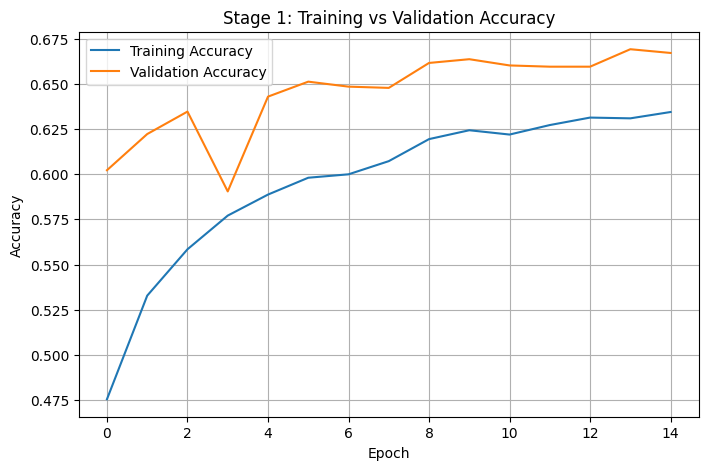

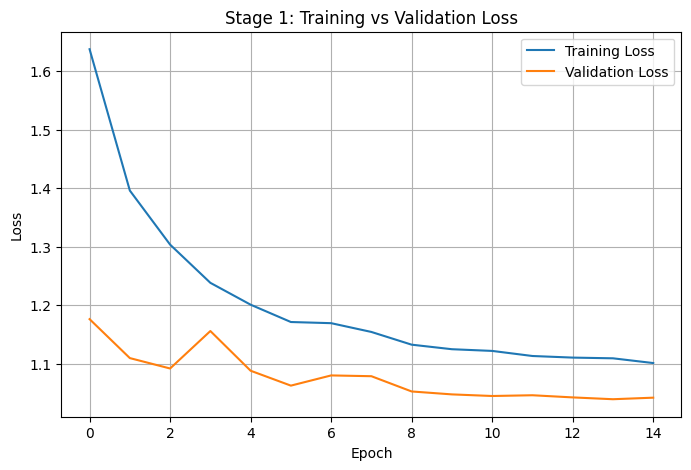

In [68]:
import matplotlib.pyplot as plt

# Accuracy
plt.figure(figsize=(8,5))
plt.plot(history_head.history["accuracy"], label="Training Accuracy")
plt.plot(history_head.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Stage 1: Training vs Validation Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Loss
plt.figure(figsize=(8,5))
plt.plot(history_head.history["loss"], label="Training Loss")
plt.plot(history_head.history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Stage 1: Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

In [73]:
base_model.trainable = True

In [74]:
base_model.trainable = True

fine_tune_at = 320

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

for layer in base_model.layers[fine_tune_at:]:

    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False
    else:
        layer.trainable = True

In [75]:
model.compile(

    optimizer=tf.keras.optimizers.AdamW(
        learning_rate=5e-6,
        weight_decay=1e-5
    ),

    loss=tf.keras.losses.CategoricalCrossentropy(
        label_smoothing=0.05
    ),

    metrics=[
        "accuracy",
        tf.keras.metrics.TopKCategoricalAccuracy(
            k=2,
            name="top2_acc"
        )
    ]
)

In [76]:
history_fine = model.fit(

    train_generator,

    validation_data=valid_generator,

    epochs=HEAD_EPOCHS + FINE_TUNE_EPOCHS,

    initial_epoch=history_head.epoch[-1] + 1,

    callbacks=callbacks,

    verbose=1

)

Epoch 16/35


2026-06-18 18:20:04.086959: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-18 18:20:04.308153: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


404/446 ━━━━━━━━━━━━━━━━━━━━ 25s 617ms/step - accuracy: 0.6372 - loss: 1.0980 - top2_acc: 0.8373

2026-06-18 18:24:39.304065: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-18 18:24:39.525808: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


446/446 ━━━━━━━━━━━━━━━━━━━━ 380s 742ms/step - accuracy: 0.6438 - loss: 1.0876 - top2_acc: 0.8450 - val_accuracy: 0.6782 - val_loss: 1.0204 - val_top2_acc: 0.8605 - learning_rate: 5.0000e-06
Epoch 17/35
446/446 ━━━━━━━━━━━━━━━━━━━━ 284s 637ms/step - accuracy: 0.6497 - loss: 1.0687 - top2_acc: 0.8488 - val_accuracy: 0.6823 - val_loss: 1.0113 - val_top2_acc: 0.8633 - learning_rate: 5.0000e-06
Epoch 18/35
446/446 ━━━━━━━━━━━━━━━━━━━━ 287s 642ms/step - accuracy: 0.6622 - loss: 1.0506 - top2_acc: 0.8606 - val_accuracy: 0.6954 - val_loss: 1.0055 - val_top2_acc: 0.8660 - learning_rate: 5.0000e-06
Epoch 19/35
446/446 ━━━━━━━━━━━━━━━━━━━━ 284s 636ms/step - accuracy: 0.6703 - loss: 1.0304 - top2_acc: 0.8643 - val_accuracy: 0.6906 - val_loss: 0.9992 - val_top2_acc: 0.8695 - learning_rate: 5.0000e-06
Epoch 20/35
446/446 ━━━━━━━━━━━━━━━━━━━━ 282s 633ms/step - accuracy: 0.6769 - loss: 1.0222 - top2_acc: 0.8649 - val_accuracy: 0.6941 - val_loss: 0.9926 - val_top2_acc: 0.8709 - learning_rate: 5.0000e-

In [77]:
# Evaluate on test dataset
test_loss, test_acc, test_top2 = model.evaluate(test_generator, verbose=1)

print("="*40)
print(f"Test Loss      : {test_loss:.4f}")
print(f"Test Accuracy  : {test_acc:.4f}")
print(f"Top-2 Accuracy : {test_top2:.4f}")
print("="*40)

61/61 ━━━━━━━━━━━━━━━━━━━━ 28s 467ms/step - accuracy: 0.7140 - loss: 0.9419 - top2_acc: 0.8845
Test Loss      : 0.9419
Test Accuracy  : 0.7140
Top-2 Accuracy : 0.8845


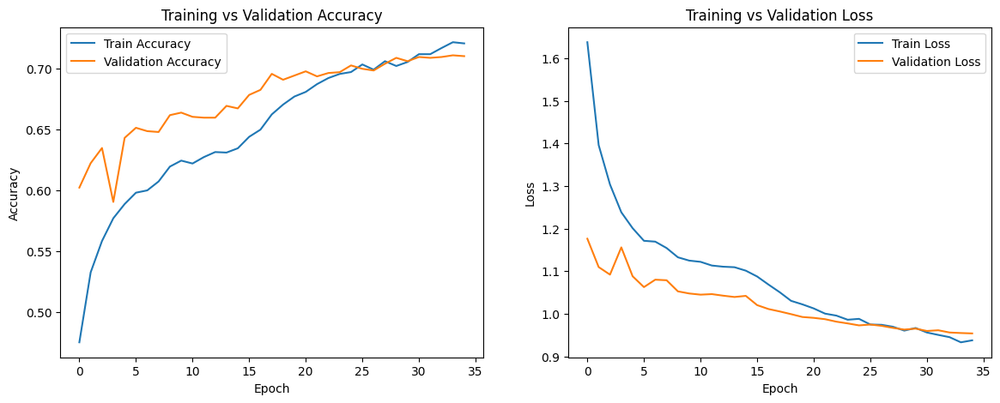

In [78]:
import matplotlib.pyplot as plt

acc = history_head.history['accuracy'] + history_fine.history['accuracy']
val_acc = history_head.history['val_accuracy'] + history_fine.history['val_accuracy']

loss = history_head.history['loss'] + history_fine.history['loss']
val_loss = history_head.history['val_loss'] + history_fine.history['val_loss']

plt.figure(figsize=(14,5))

plt.subplot(1,2,1)
plt.plot(acc,label="Train Accuracy")
plt.plot(val_acc,label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()

plt.subplot(1,2,2)
plt.plot(loss,label="Train Loss")
plt.plot(val_loss,label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()

plt.show()

In [79]:
import numpy as np
from sklearn.metrics import classification_report

test_generator.reset()

pred = model.predict(test_generator, verbose=1)

y_pred = np.argmax(pred, axis=1)
y_true = test_generator.classes

print(classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    digits=4
))

61/61 ━━━━━━━━━━━━━━━━━━━━ 30s 312ms/step
                                precision    recall  f1-score   support

    Cassava___bacterial_blight     0.5798    0.5561    0.5677       196
Cassava___brown_streak_disease     0.7467    0.6770    0.7102       418
        Cassava___green_mottle     0.7607    0.7374    0.7489       457
             Cassava___healthy     0.6097    0.6832    0.6444       423
      Cassava___mosaic_disease     0.8072    0.8257    0.8163       436

                      accuracy                         0.7140      1930
                     macro avg     0.7008    0.6959    0.6975      1930
                  weighted avg     0.7167    0.7140    0.7144      1930



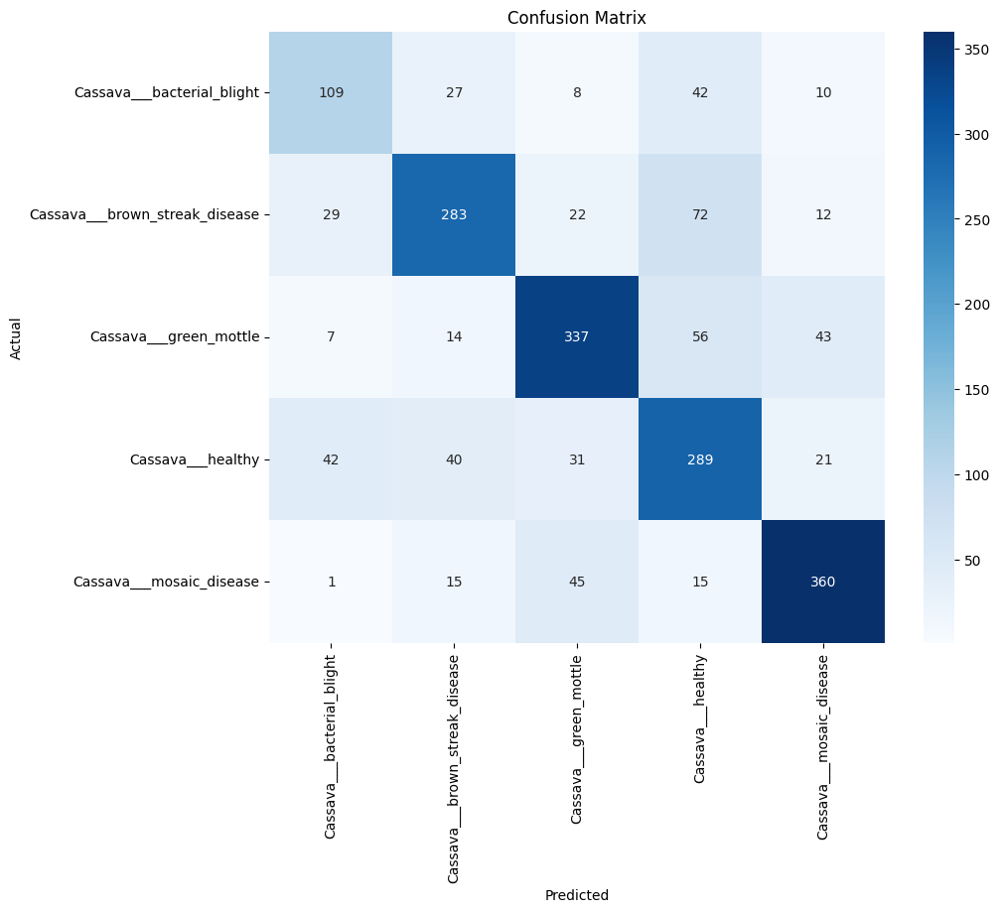

In [80]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10,8))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.show()

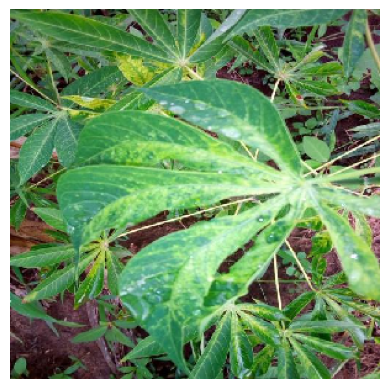

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
Prediction : Cassava___mosaic_disease
Confidence : 0.8583273


In [81]:
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input
import matplotlib.pyplot as plt
import numpy as np

image_path = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/test/Cassava___mosaic_disease/733770850_jpg.rf.d9c7feff92924843ba057633630e0309.jpg"

img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))

plt.imshow(img)
plt.axis("off")
plt.show()

x = img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

prediction = model.predict(x)

predicted_class = class_names[np.argmax(prediction)]
confidence = np.max(prediction)

print("Prediction :", predicted_class)
print("Confidence :", confidence)

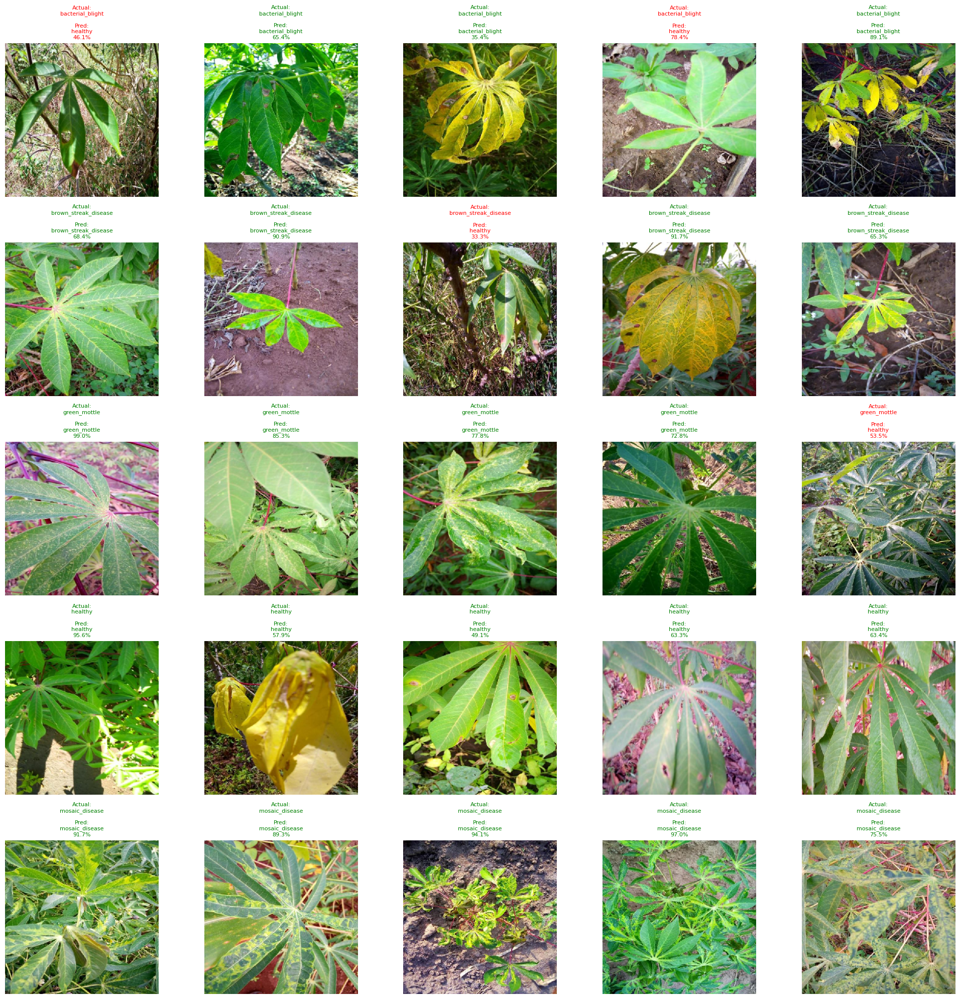

In [82]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input

# Test dataset path
test_dir = "/kaggle/input/datasets/aliyafatma2/cassava-leaf-dataset/test"

plt.figure(figsize=(20, 20))

plot_idx = 1

for actual_class in class_names:

    class_path = os.path.join(test_dir, actual_class)

    images = os.listdir(class_path)

    # Randomly select up to 5 images
    images = random.sample(images, min(5, len(images)))

    for image_name in images:

        image_path = os.path.join(class_path, image_name)

        img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))

        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        pred = model.predict(x, verbose=0)

        pred_idx = np.argmax(pred)

        pred_class = class_names[pred_idx]

        confidence = np.max(pred)

        plt.subplot(len(class_names), 5, plot_idx)

        plt.imshow(img)

        color = "green" if pred_class == actual_class else "red"

        plt.title(
            f"Actual:\n{actual_class.split('___')[-1]}\n\n"
            f"Pred:\n{pred_class.split('___')[-1]}\n"
            f"{confidence*100:.1f}%",
            fontsize=8,
            color=color
        )

        plt.axis("off")

        plot_idx += 1

plt.tight_layout()

plt.show()

In [83]:
wrong = np.where(y_true != y_pred)[0]

print("Total Test Images :", len(y_true))
print("Correct :", len(y_true)-len(wrong))
print("Wrong :", len(wrong))

Total Test Images : 1930
Correct : 1378
Wrong : 552


In [84]:
model.save("cassava_efficientnetv2b3.keras")

In [85]:
import tensorflow as tf

# Convert Keras model to TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(model)

tflite_model = converter.convert()

# Save the model
with open("cassava_efficientnetv2s.tflite", "wb") as f:
    f.write(tflite_model)

print("✅ TFLite model saved as cassava_efficientnetv2b3.tflite")

INFO:tensorflow:Assets written to: /tmp/tmp4er3w6fa/assets


INFO:tensorflow:Assets written to: /tmp/tmp4er3w6fa/assets


Saved artifact at '/tmp/tmp4er3w6fa'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 300, 300, 3), dtype=tf.float32, name='keras_tensor_409')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  133101711520208: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  133101711520016: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  133101727214352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133101711522128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133101711523088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133103575257296: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133101727214736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133101711519440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133101711521936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  133101711520400: TensorSpec(shape=(), dtype=tf.resource, name=

W0000 00:00:1781813122.253937      58 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1781813122.253975      58 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1781813122.625948      58 mlir_graph_optimization_pass.cc:425] MLIR V1 optimization pass is not enabled


✅ TFLite model saved as cassava_efficientnetv2b3.tflite
